In [1]:
library(ArchR)
set.seed(1)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(tidyverse)
library(here)
library(Seurat)
library(ComplexHeatmap)

Loading required package: ggplot2

Loading required package: SummarizedExperiment

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    unio

### Load data

In [2]:
Merged.proj.PTM<-readRDS(file="/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/Save-ArchR-Project.rds")

### Save data

In [121]:
Merged.proj.PTM<-saveArchRProject(ArchRProj = Merged.proj.PTM,outputDirectory = "PTMstroma.subset.version2", load = TRUE,overwrite = TRUE)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

### Dimensionality reduction

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-7f5659a808ee-Date-2020-11-01_Time-12-10-24.log
If there is an issue, please report to github with logFile!

2020-11-01 12:10:25 : Computing Total Accessibility Across All Features, 0.006 mins elapsed.

2020-11-01 12:10:27 : Computing Top Features, 0.043 mins elapsed.

###########
2020-11-01 12:10:27 : Running LSI (1 of 2) on Top Features, 0.048 mins elapsed.
###########

2020-11-01 12:10:28 : Sampling Cells (N = 10002) for Estimated LSI, 0.049 mins elapsed.

2020-11-01 12:10:28 : Creating Sampled Partial Matrix, 0.049 mins elapsed.

2020-11-01 12:10:52 : Computing Estimated LSI (projectAll = FALSE), 0.459 mins elapsed.

2020-11-01 12:14:15 : Identifying Clusters, 3.844 mins elapsed.

2020-11-01 12:14:39 : Identified 6 Clusters, 4.237 mins elapsed.

2020-11-01 12:14:39 : Saving LSI Iteration, 4.237 mins elapsed.

2020-11-01 12:15:04 : Creating Cluster Matrix on the total Group Features, 4.664 mins elapsed.

2020-11-0

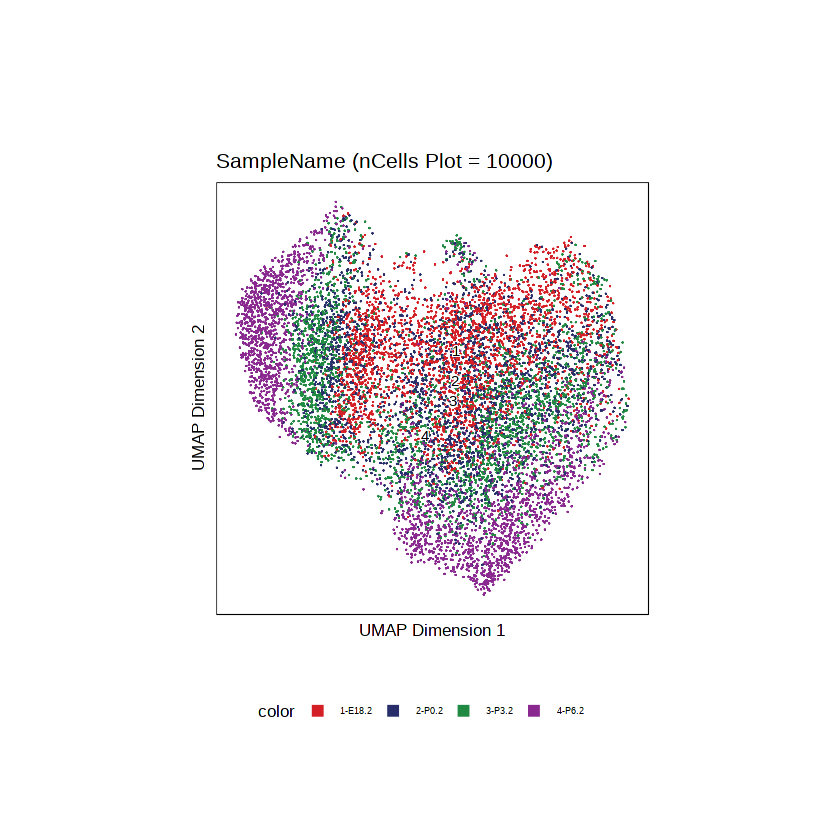

In [6]:
Merged.proj.PTM <- addIterativeLSI(
    ArchRProj = Merged.proj.PTM,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI", 
    iterations = 2, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(0.7), 
        sampleCells = 10000, 
        n.start = 10,
        algorithm= 1    ), 
    varFeatures = 150000, 
    dimsToUse = 1:30,
    force = TRUE
)


In [7]:
Merged.proj.PTM <- addUMAP(
    ArchRProj = Merged.proj.PTM, 
    reducedDims = "IterativeLSI", 
    name = "UMAP", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine",
    force = TRUE
)

12:22:31 UMAP embedding parameters a = 0.583 b = 1.334

12:22:31 Read 20636 rows and found 30 numeric columns

12:22:31 Using Annoy for neighbor search, n_neighbors = 30

12:22:31 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

12:22:34 Writing NN index file to temp file /tmp/RtmpeYT4LH/file7f56258c861b

12:22:34 Searching Annoy index using 12 threads, search_k = 3000

12:22:35 Annoy recall = 100%

12:22:36 Commencing smooth kNN distance calibration using 12 threads

12:22:37 Initializing from normalized Laplacian + noise

12:22:37 Commencing optimization for 200 epochs, with 958500 positive edges

12:22:46 Optimization finished



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-7f5610ad74be-Date-2020-11-12_Time-11-05-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-7f5610ad74be-Date-2020-11-12_Time-11-05-43.log



$Sample

$Seurat.Clusters


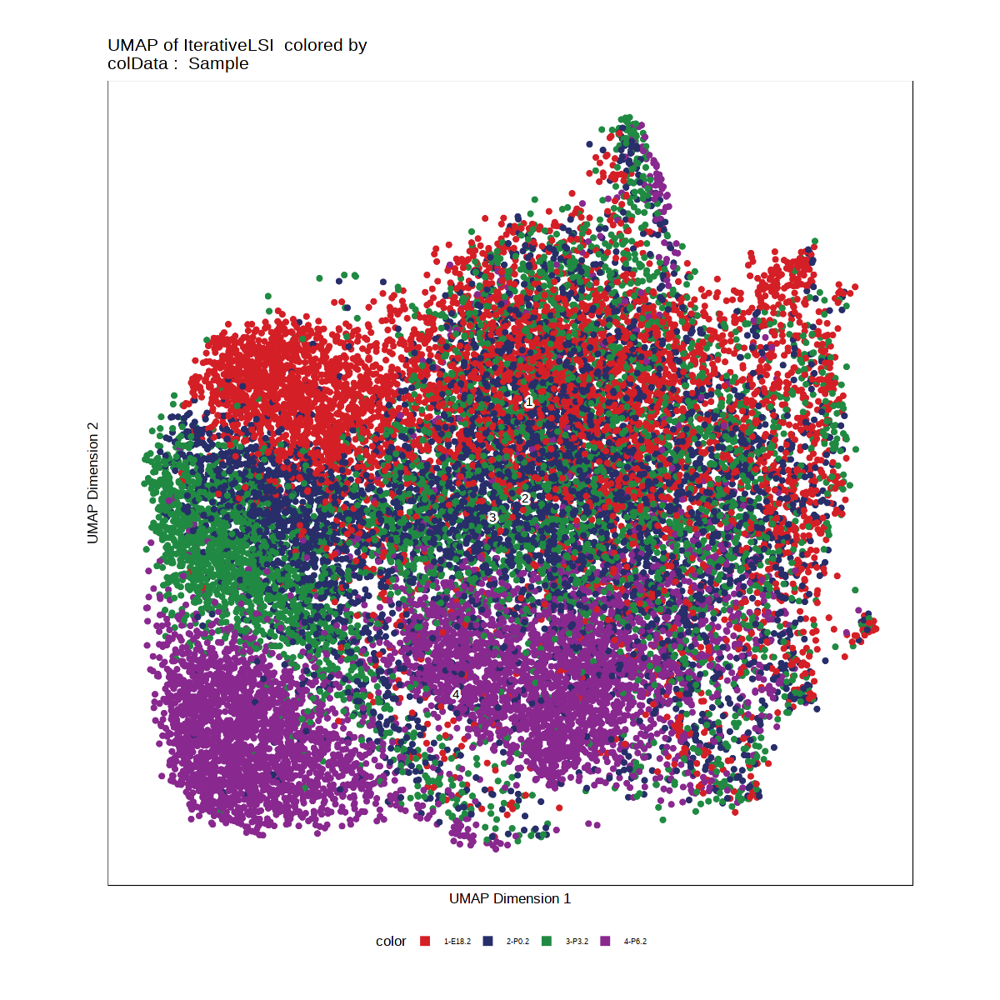

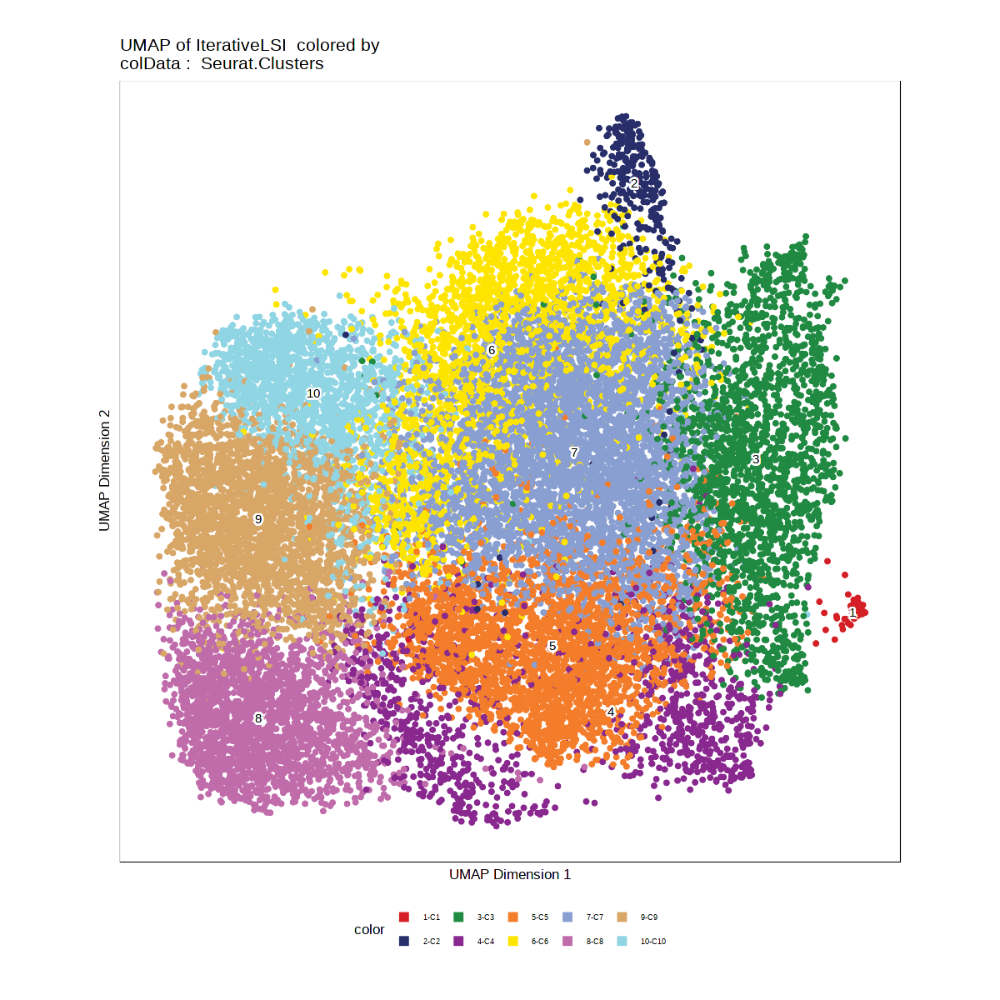

In [143]:
p1 <- plotEmbedding(
    Merged.proj.PTM, 
    colorBy = "cellColData", 
    name = c("Sample", "Seurat.Clusters"), 
#      pal = pal,
    size=1,
    plotAs = "points"
)
p1

### 3D ploting

10:57:03 UMAP embedding parameters a = 0.67 b = 1.278

10:57:03 Read 20636 rows and found 30 numeric columns

10:57:03 Using Annoy for neighbor search, n_neighbors = 35

10:57:03 Building Annoy index with metric = euclidean, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

10:57:05 Writing NN index file to temp file /tmp/RtmpeYT4LH/file7f561511ceaa

10:57:05 Searching Annoy index using 1 thread, search_k = 3500

10:57:12 Annoy recall = 100%

10:57:13 Commencing smooth kNN distance calibration using 1 thread

10:57:14 Initializing from normalized Laplacian + noise

10:57:15 Commencing optimization for 200 epochs, with 1119732 positive edges

10:57:25 Optimization finished



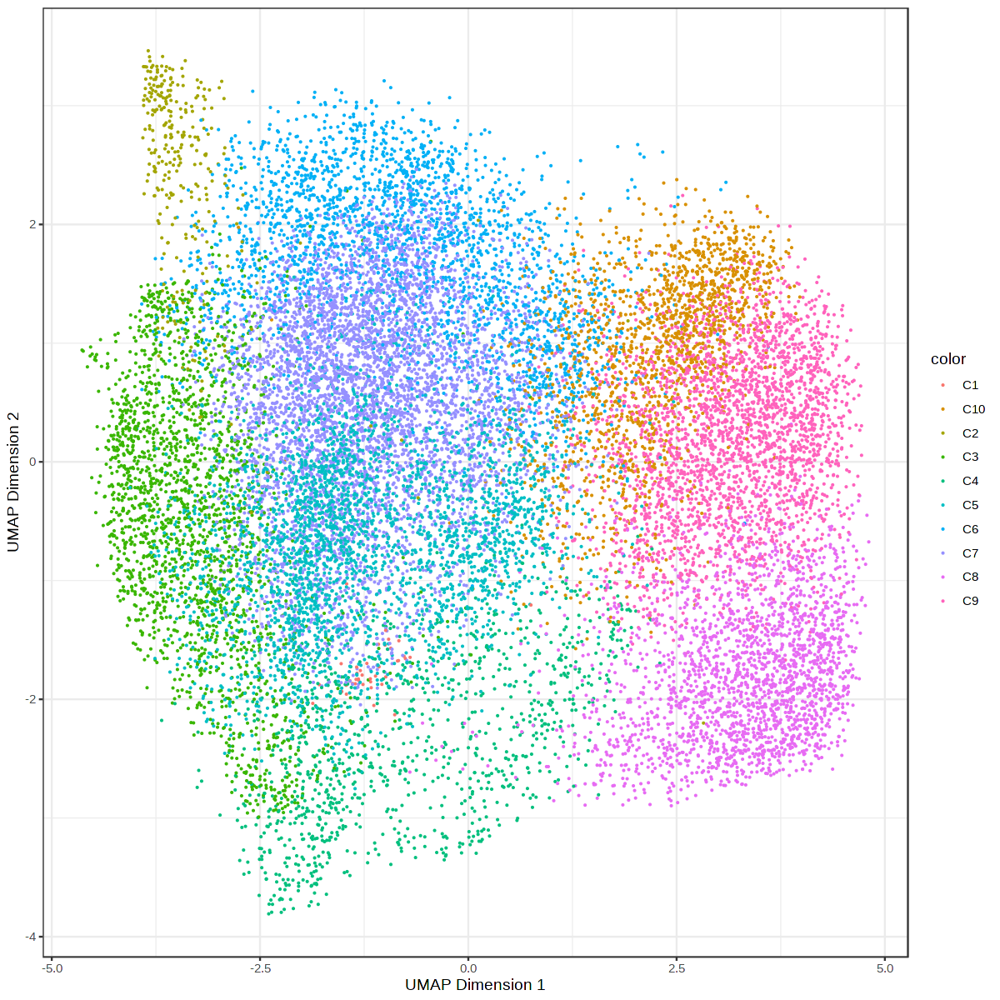

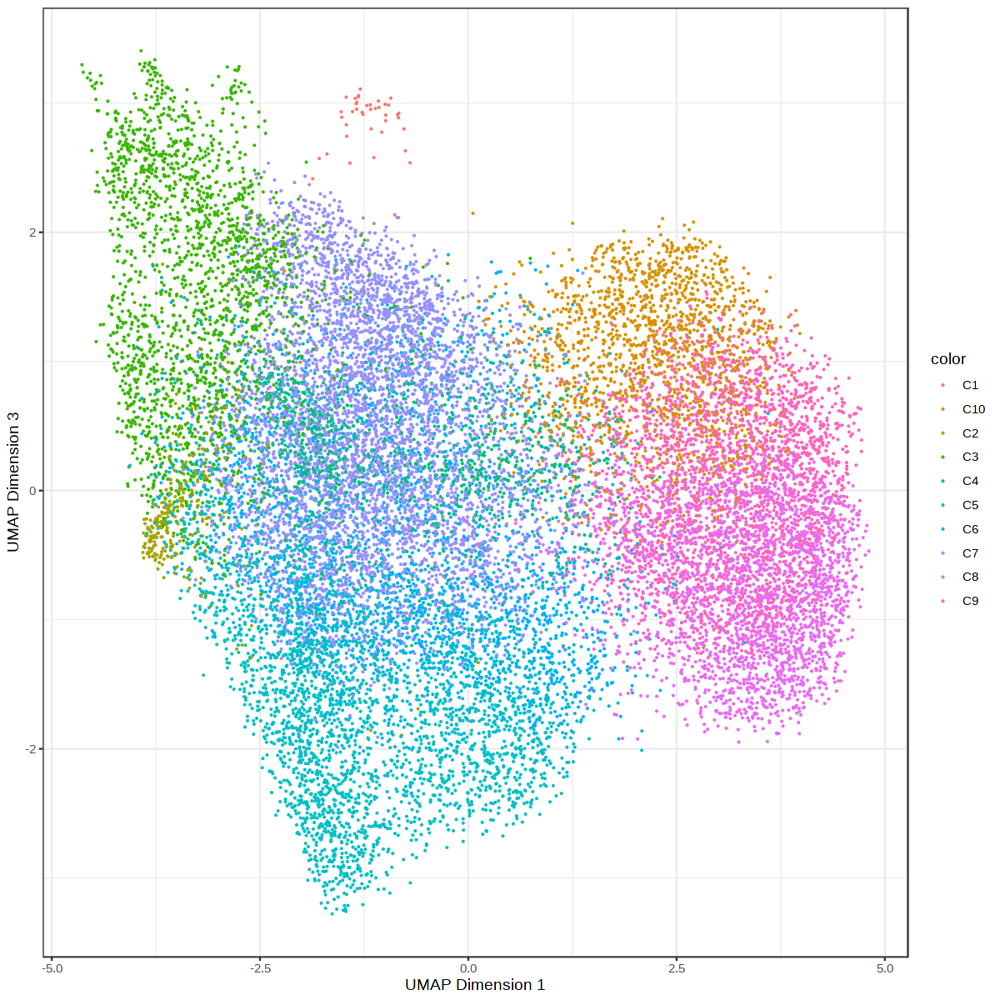

In [134]:
## Test 3D umap
embeddingParams <- list()
embeddingParams$X <- getReducedDims(
      ArchRProj = Merged.proj.PTM, 
      reducedDims = "IterativeLSI", 
      dimsToUse = 1:30, 
      corCutOff = 0.75, 
      scaleDims = NULL
  )


uwotUmap <- uwot::umap(
    embeddingParams$X, 
    n_neighbors = 35, 
    n_components = 3,
    min_dist = 0.45, 
    metric = "euclidean", 
    n_threads = 1, 
    verbose = TRUE, 
    ret_nn = TRUE,
    ret_model = TRUE
    )
clusters <- Merged.proj.PTM@cellColData$Seurat.Clusters
options(repr.plot.width=10,repr.plot.height=10)
df <- data.frame(
    x = uwotUmap[[1]][,1],
    y = -uwotUmap[[1]][,2], 
    color = clusters
    )
# ggplot(df,aes(x,y,color=color)) + 
#     geom_point(size=0.1) + 
#     theme_bw() + 
# #     scale_color_manual(values=) +
#     xlab("UMAP Dimension 1") + 
#     ylab("UMAP Dimension 2")
# df <- data.frame(
#     x = uwotUmap[[1]][,1],
#     y = -uwotUmap[[1]][,3], 
#     color = clusters
#     )
# ggplot(df,aes(x,y,color=color)) + 
#     geom_point(size=0.1) + 
#     theme_bw() + 
# #     scale_color_manual(values=) +
#     xlab("UMAP Dimension 1") + 
#     ylab("UMAP Dimension 3")




In [135]:
sample <- as.factor(Merged.proj.PTM@cellColData$Sample)
# levels(sample) <- relevel(sample, ref = "E18.2")
sample <- as.numeric(sample)
clusters <- as.factor(Merged.proj.PTM@cellColData$Seurat.Clusters) %>% relevel(ref = "C1") %>% as.numeric()
# Group_Co <- as.factor(Merged.proj2@cellColData$predictedGroup_Co)
# # levels(Group_Co) <- relevel(Group_Co, ref = "Germ cells")
# Group_Co <- as.numeric(Group_Co)
# # clusters <- substr(Merged.proj2@cellColData$Clusters,2,5)

df_3d <- data.frame(
    x = uwotUmap[[1]][,1],
    y = uwotUmap[[1]][,2], 
    z = uwotUmap[[1]][,3], 
    color = clusters,
    sample= sample
#     Group_Un = Group_Un,
#     Group_Co = Group_Co
    )
rownames(df_3d) <- rownames(Merged.proj.PTM@cellColData)
df_3d %>% write_tsv("4samples_PTM_archr_3dumap.tsv")

### 3D umap and ploting

In [228]:
col2 <-  c("#D51F26","#90D5E4","#272E6A","#208A42","#89288F","#F47D2B", "#FEE500","#8A9FD1","#C06CAB",
             "#D8A767"  )

df_3d <- data.frame(
    x = -uwotUmap[[1]][,1],
    y = uwotUmap[[1]][,2], 
    z = -(uwotUmap[[1]][,3]), 
    color = clusters,
    sample= sample
#     Group_Un = Group_Un,
#     Group_Co = Group_Co
    )
rownames(df_3d) <- rownames(Merged.proj.PTM@cellColData)
df_3d %>% write_tsv("4samples_PTM_archr_3dumap.tsv")

# col2 <- c("#dec78d","#8dc0bd","#dec78d","#dec78d","#8dc0bd","#8dc0bd")


In [258]:
library("plot3D")
pdf(file="PTMstoma.3DUMAP.30degree.pdf",width=5,height=5)
cex = 0.2
alpha =0.8
pch= 19
options(repr.plot.width=5,repr.plot.height=5)
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 0,size=1
                 )

plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 30,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 60,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 90,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 120,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 150,size=1
                 )

plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 180,size=1
                 )
dev.off()

png 
  2

In [257]:
library("plot3D")
pdf(file="PTMstoma.3DUMAP.45degree.pdf",width=5,height=5)
cex = 0.2
alpha =0.8
pch= 19

options(repr.plot.width=5,repr.plot.height=5)
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 0,size=1
                 )

plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 45,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 90,size=1
                 )
plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 135,size=1
                 )

plot3D::scatter3D(df_3d$x, df_3d$z, -df_3d$y,colvar = df_3d$color, bty = "u", type = "p",
          pch = pch,alpha=alpha,
# xlim=c(-3,3), ylim=c(-3,4), zlim=c(-3,4),
                  cex=cex,
                  col.panel = grey(0.96), col.axis = "grey", lwd.grid = 2, col.grid = "white",
 col = col2, 
ticktype = "detailed",
phi = 0,theta = 180,size=1
                 )
dev.off()

png 
  2

### Add clusters

In [14]:
Merged.proj.PTM <- addClusters(
    input = Merged.proj.PTM,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Seurat.Clusters",
    resolution = 0.7,
    force= TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-7f56158f7f34-Date-2020-11-01_Time-12-26-45.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Seurat.Clusters

2020-11-01 12:26:45 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 20636
Number of edges: 656705

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7789
Number of communities: 10
Elapsed time: 2 seconds


2020-11-01 12:27:39 : Testing Biased Clusters, 0.895 mins elapsed.

2020-11-01 12:27:39 : Testing Outlier Clusters, 0.896 mins elapsed.

2020-11-01 12:27:39 : Assigning Cluster Names to 10 Clusters, 0.896 mins elapsed.

2020-11-01 12:27:39 : Finished addClusters, 0.897 mins elapsed.



### Peak calling

In [18]:
pathToMacs2 <- findMacs2()
Merged.proj.PTM <- addReproduciblePeakSet(
    ArchRProj = Merged.proj.PTM, 
    groupBy = "Seurat.Clusters", 
    pathToMacs2 = pathToMacs2
)


Searching For MACS2..

Found with $path!

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-7f5633ca04c4-Date-2020-11-01_Time-12-29-53.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2020-11-01 12:29:53 : Peak Calling Parameters!, 0.005 mins elapsed.



    Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
C1     C1     41         39           2   23   27    19500
C2     C2    297       1721           4  221  500   150000
C3     C3   2054       1387           4  233  433   150000
C4     C4   1116        191           3   51   82    95500
C5     C5   2889       1180           4   98  500   150000
C6     C6   2518       1193           3  215  500   150000
C7     C7   5028       1517           4  190  500   150000
C8     C8   2226       1182           4   75  500   150000
C9     C9   2772       1649           4  149  500   150000
C10   C10   1695       1801           4  301  500   150000


2020-11-01 12:29:53 : Batching Peak Calls!, 0.005 mins elapsed.

2020-11-01 12:29:53 : Batch Execution w/ safelapply!, 0 mins elapsed.

2020-11-01 12:29:53 : Group 1 of 35, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name C1._.Rep1-1 --treatment /home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/InsertionBeds/C1._.Rep1-1.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2020-11-01 12:30:42 : Group 2 of 35, Calling Peaks with MACS2!, 0.808 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name C2._.P3.2-2 --treatment /home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/InsertionBeds/C2._.P3.2-2.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/InsertionBeds --format BED --call-summits --keep-d

[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C1-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C10-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C2-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C3-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C4-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C5-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C6-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C7-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C8-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2/PeakCalls/C9-reproduciblePeaks.gr.rds"


2020-11-01 12:54:07 : Creating Union Peak Set!, 24.231 mins elapsed.

Converged after 7 iterations!

Plotting Ggplot!

2020-11-01 12:54:10 : Finished Creating Union Peak Set (119726)!, 24.281 mins elapsed.



In [6]:
Merged.proj.PTM <- addPeakMatrix(Merged.proj.PTM)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-5c1e574fc275-Date-2020-10-24_Time-22-27-30.log
If there is an issue, please report to github with logFile!

2020-10-24 22:27:30 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-24 22:27:41 : Adding P3.2 to PeakMatrix for Chr (1 of 20)!, 0.006 mins elapsed.

2020-10-24 22:27:43 : Adding P3.2 to PeakMatrix for Chr (2 of 20)!, 0.042 mins elapsed.

2020-10-24 22:27:45 : Adding P3.2 to PeakMatrix for Chr (3 of 20)!, 0.082 mins elapsed.

2020-10-24 22:27:47 : Adding P3.2 to PeakMatrix for Chr (4 of 20)!, 0.114 mins elapsed.

2020-10-24 22:27:49 : Adding P3.2 to PeakMatrix for Chr (5 of 20)!, 0.152 mins 

In [7]:
Merged.proj.PTM <- addMotifAnnotations(ArchRProj = Merged.proj.PTM, motifSet = "cisbp", name = "Motif",force = TRUE)
Merged.proj.PTM <- addBgdPeaks(Merged.proj.PTM)


No methods found in package ‘IRanges’ for request: ‘score’ when loading ‘TFBSTools’

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-5c1ec66c167-Date-2020-10-24_Time-22-30-44.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2020-10-24 22:30:45 : Gettting Motif Set, Species : Mus musculus, 0.004 mins elapsed.

Using version 2 motifs!

2020-10-24 22:30:46 : Finding Motif Positions with motifmatchr!, 0.026 mins elapsed.

2020-10-24 22:32:20 : Creating Motif Overlap Matrix, 1.584 mins elapsed.

2020-10-24 22:32:22 : Finished Getting Motif Info!, 1.62 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-5c1ec66c167-Date-2020-10-24_Time-22-30-44.log

Identifying Background Peaks!



In [8]:
Merged.proj.PTM <- addDeviationsMatrix(
  ArchRProj = Merged.proj.PTM, 
  peakAnnotation = "Motif",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-5c1e54b99a11-Date-2020-10-24_Time-22-32-29.log
If there is an issue, please report to github with logFile!



NULL


2020-10-24 22:32:31 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-24 22:32:43 : chromVAR deviations P3.2 (1 of 4) Schep (2017), 0.202 mins elapsed.

2020-10-24 22:33:27 : P3.2 (1 of 4) : Deviations for Annotation 44 of 884, 0.565 mins elapsed.

2020-10-24 22:34:01 : P3.2 (1 of 4) : Deviations for Annotation 88 of 884, 1.135 mins elapsed.

2020-10-24 22:34:31 : P3.2 (1 of 4) : Deviations for Annotation 132 of 884, 1.634 mins elapsed.

2020-10-24 22:35:16 : P3.2 (1 of 4) : Deviations for Annotation 176 of 884, 2.376 mins elapsed.

2020-10-24 22:36:00 : P3.2 (1 of 4) : Deviations for Annotation 220 of 884, 3.117 mins elapsed.

2020-10-24 22:36:3

### Find marker genes

In [22]:
markersGS <- getMarkerFeatures(
    ArchRProj = Merged.proj.PTM, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Seurat.Clusters",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    k = 500,
    normBy = "ReadsInTSS",
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-7f565eace7f1-Date-2020-11-01_Time-13-06-08.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2020-11-01 13:06:08 : Matching Known Biases, 0.001 mins elapsed.

2020-11-01 13:06:12 : Computing Pairwise Tests (1 of 10), 0.071 mins elapsed.

2020-11-01 13:06:29 : Computing Pairwise Tests (2 of 10), 0.354 mins elapsed.

2020-11-01 13:06:46 : Computing Pairwise Tests (3 of 10), 0.625 mins elapsed.

2020-11-01 13:07:02 : Computing Pairwise Tests (4 of 10), 0.902 mins elapsed.

2020-11-01 13:07:19 : Computing Pairwise Tests (5 of 10), 1.176 mins elapsed.

2020-11-01 13:07:35 : Computing Pairwise Tests (6 of 10), 1.453 mins elapsed.

2020-11-01 13:07:52 : Computing Pairwise Tests (7 of 10), 1.739 mins elapsed.

2020-11-01 13:08:09 : Computing Pairwise Tests (8 of 10), 2.017 mins elapsed.

2020-11-01 13:08:26 : Computing Pairwise Tests (9 of 10), 2.294 mins elapsed.

2020-11-01 13:08:43 : Comp

In [112]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.1 & Log2FC >= 0")
markerList$C10

DataFrame with 442 rows and 9 columns
      seqnames     start       end  strand          name     idx
         <Rle>   <array>   <array> <array>       <array> <array>
20821     chr8  11312826  11198423       2        Col4a1      56
2055     chr10  82985497  83195900       1        Chst11     697
20822     chr8  11312805  11449287       1        Col4a2      57
396       chr1  73864466  73618381       2 6030407O03Rik     396
4221     chr11 117199661 117362325       1         Sept9    1716
...        ...       ...       ...     ...           ...     ...
13430     chr3  34716662  34699640       2        Gm3143     132
22260     chr9  38329492  38330559       1        Olfr25     322
12793     chr2 148046969 148042877       2         Foxa2    1540
8091     chr16  18426417  18479073       1        Txnrd2     188
1660     chr10  56377273  56390419       1          Gja1     302
                 Log2FC                  FDR           MeanDiff
              <numeric>            <numeric>         

In [113]:
C10.marker <- markerList$C10$name

In [114]:
C10.marker

[1] "Col4a1"        "Chst11"        "Col4a2"        "6030407O03Rik"
  [5] "Sept9"         "Rbms3"         "Pde10a"        "Greb1"        
  [9] "Pakap"         "Rerg"          "2610307P16Rik" "Col5a1"       
 [13] "Syn3"          "Nfia"          "1700020M21Rik" "Enpep"        
 [17] "Lncenc1"       "Cacna1s"       "Ncald"         "Ccdc88c"      
 [21] "Col13a1"       "Enox1"         "Tspan11"       "Kcnk12"       
 [25] "Kcnk2"         "Osbpl10"       "Mir3084-1"     "Tenm4"        
 [29] "Slc9a9"        "B4galt5"       "Pde9a"         "Smad3"        
 [33] "Ngfr"          "Gm4265"        "Gm19299"       "Timp3"        
 [37] "Igsf21"        "Gm31763"       "4930449E01Rik" "Mtx2"         
 [41] "5330416C01Rik" "Bmp7"          "Kcns2"         "Cdkal1"       
 [45] "Spry4"         "Akap2"         "E130114P18Rik" "Hmgb4"        
 [49] "Lhfpl2"        "Csmd2"         "Tspan5"        "Kcnj5"        
 [53] "Dap"           "Bdnf"          "Macrod2"       "1700028P15Rik"
 [57] "Fli1"          "Tead1"         "Zfp438"        "Mir6401"      
 [61] "Msi2"          "4930546C10Rik" "Pald1"         "Myo1b"        
 [65] "4930572O13Rik" "Sorcs2"        "Tcim"          "Map10"        
 [69] "Svil"          "Tmc3"          "F2rl1"         "Aox2"         
 [73] "Cacna1h"       "Ptp4a3"        "Mical2"        "Fgf1"         
 [77] "2700089I24Rik" "Lrrc32"        "Ets1"          "1700066B17Rik"
 [81] "Gli2"          "Stab2"         "Fabp6"         "Bbx"          
 [85] "Clca3a1"       "Galnt12"       "Cyp2j9"        "Tcf15"        
 [89] "Hoxb2"         "Gm15413"       "Tmcc3"         "4930401O12Rik"
 [93] "Maml3"         "Mymk"          "Rnf144a"       "Cntfr"        
 [97] "Sorbs1"        "Pde4b"         "Kcnd3"         "Mir6346"      
[101] "Grip1"         "Cpn2"          "Rflna"         "Tmem174"      
[105] "4930549C15Rik" "Sgcd"          "Mir378b"       "A330076C08Rik"
[109] "Nfkbiz"        "Itga1"         "Tcl1"          "Foxc1"        
[113] "Grk3"          "Tbx5"          "Rbp1"          "Prdm1"        
[117] "2310043L19Rik" "Rad51b"        "Shisa6"        "Shc3"         
[121] "Wwox"          "1110002J07Rik" "Sox5"          "Msgn1"        
[125] "Gm33301"       "Kcnh8"         "Ptgis"         "St18"         
[129] "Ubash3b"       "Palm2"         "Add2"          "Hist1h2ba"    
[133] "Nostrin"       "Gm14005"       "Tshz2"         "Pard6b"       
[137] "Armc2"         "Tlr9"          "Plac8"         "Optc"         
[141] "Gna14"         "Tgfbr2"        "Vmn2r4"        "Sh3rf3"       
[145] "Togaram2"      "Disc1"         "Mipol1"        "Morc1"        
[149] "Prrx1"         "Dusp4"         "Pld5"          "4921525O09Rik"
[153] "Enc1"          "Hpse2"         "Kcna10"        "Exoc3l4"      
[157] "Mab21l1"       "Gm5148"        "Lrrk1"         "Wscd2"        
[161] "4930548J01Rik" "Zfp957"        "Themis2"       "Isl2"         
[165] "1700096J18Rik" "Xylt1"         "4930567H12Rik" "AI839979"     
[169] "F7"            "Cdkn2b"        "Prr5"          "Fgf12"        
[173] "Lipg"          "Pde4d"         "Fat1"          "4930482G09Rik"
[177] "Itpr1"         "Chsy1"         "Col15a1"       "Fxn"          
[181] "Mrps18a"       "Rtkn"          "S1pr3"         "Galntl6"      
[185] "Arl8b"         "8430422H06Rik" "Sh2b2"         "Rapgef5"      
[189] "Mir6538"       "D6Ertd474e"    "Serpinb1b"     "Hivep3"       
[193] "Kcnj6"         "Pou5f1-rs4"    "Pyroxd2"       "4930429H19Rik"
[197] "Cxxc4"         "Crispld1"      "Cerkl"         "Mcf2l"        
[201] "Ttc21a"        "Abhd16b"       "Lrp1b"         "Gpx5"         
[205] "Vmn2r3"        "Gm5086"        "Pou2f3"        "Il1r1"        
[209] "Clca3a2"       "Eipr1"         "1700006F04Rik" "4632428C04Rik"
[213] "4930425O10Rik" "Mir6385"       "Cyp1b1"        "Fblim1"       
[217] "Il1r2"         "Pecam1"        "Gorab"         "Myo1a"        
[221] "P2ry6"         "Eya4"          "Hs1bp3"        "Mir6356"      
[225] "Spred1"        "Mir6980"       "Mir6546"       "Gm36595"      
[229] "Ifi21

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-7f56154ff27-Date-2020-11-01_Time-17-24-38.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-11-01 17:24:39 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 4

2 of 4

3 of 4

4 of 4

Using weights on disk

1 of 4

2 of 4

3 of 4

4 of 4

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-7f56154ff27-Date-2020-11-01_Time-17-24-38.log



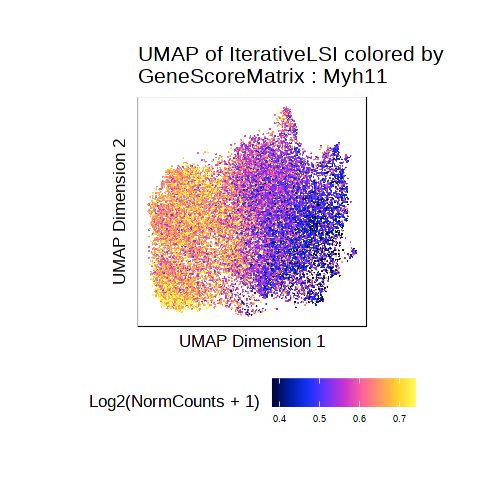

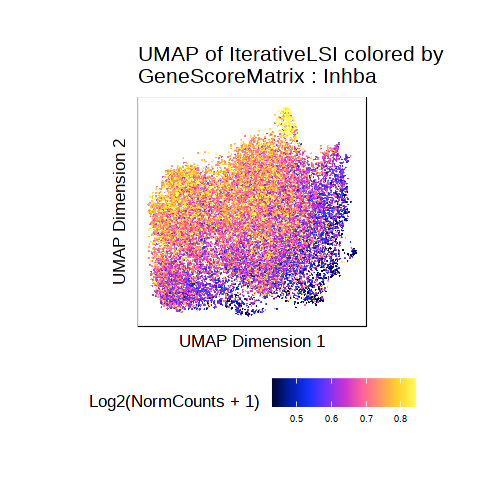

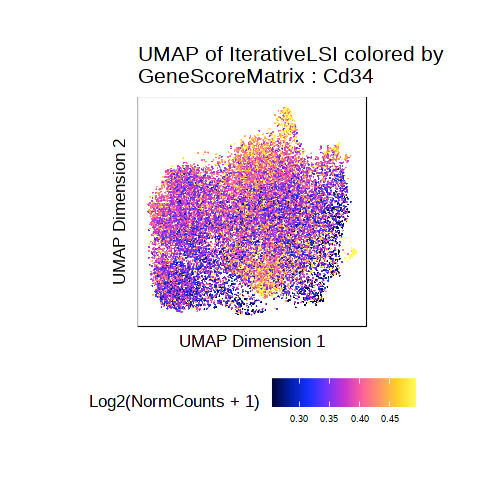

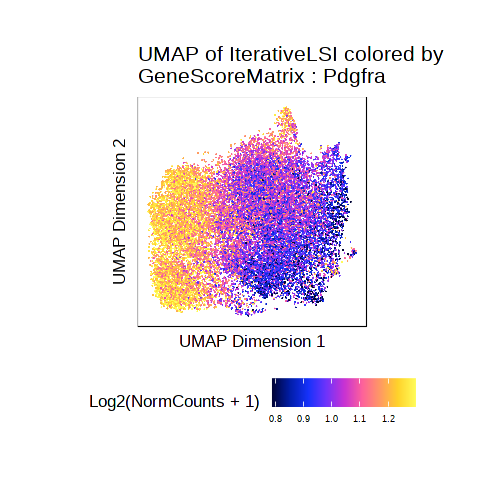

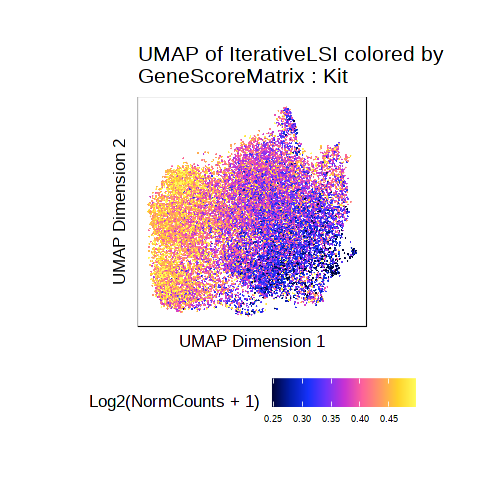

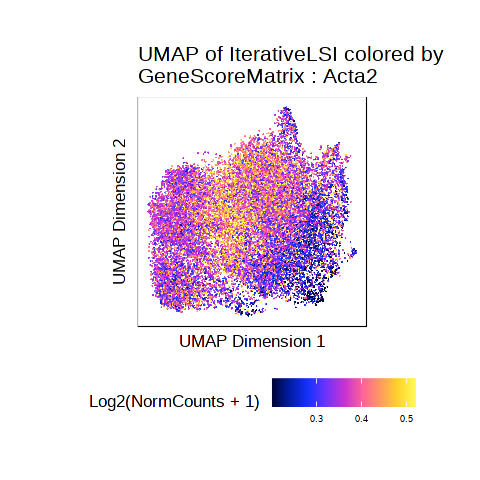

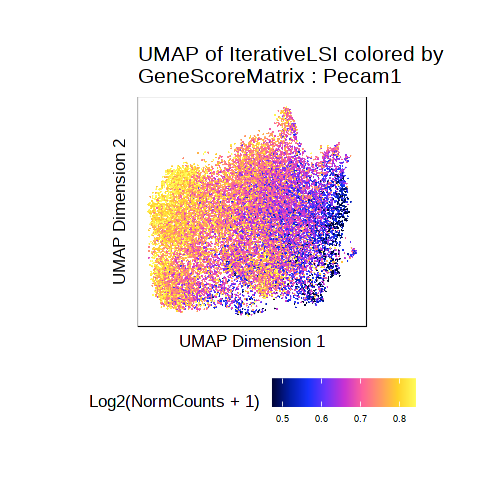

$Myh11

$Inhba

$Cd34

$Pdgfra

$Kit

$Acta2

$Pecam1

$Tcf21

$Thra


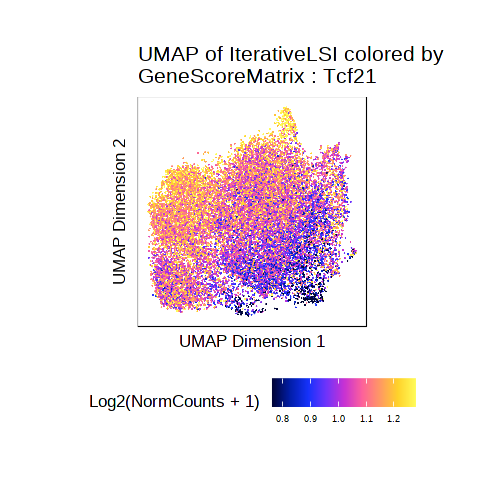

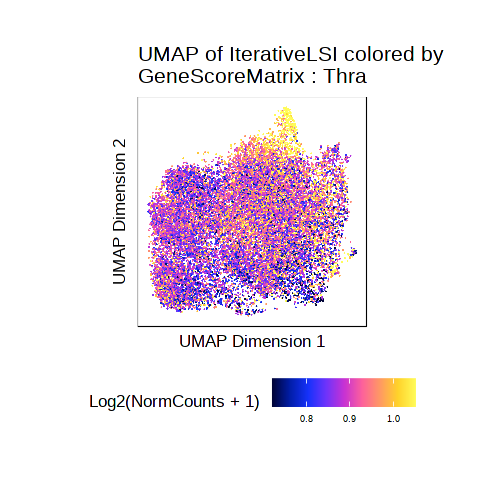

In [87]:
 options(repr.plot.height=4,repr.plot.width=4)
p <- plotEmbedding(
    ArchRProj = Merged.proj.PTM, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(Merged.proj.PTM),
    plotAs = "point",
    size=1 
)
p

In [118]:
options(repr.plot.width=5,repr.plot.height=30)
heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0", 
 labelMarkers = markerGenes,
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-7f5624b0efe9-Date-2020-11-01_Time-18-50-40.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	Cdh26, Alkal1, St18, Tcf24, Crispld1, Tfap2b, Cnnm3, Ankrd39, Mir6349, Tbc1d8, Creg2, 1700066B17Rik, Il1r2, Il1r1, Fhl2, Col3a1, Slc39a10, 9330175M20Rik, Gm17767, Myo1b

C2:

	Tns1, Twist2, Rassf5, Nav1, Ncstn, Igsf8, Atp1a2, Ephx1, Traf3ip2, E130307A14Rik, Psap, Gstt2, Palm, Ankrd52, Mir6914, Lif, Zmiz2, Mir7651, Ppia, Tns3

C3:

	Cnnm3, Ankrd39, Col3a1, Slc39a10, Wdr12, Carf, Raph1, Apol7d, Irs1, Mcm6, Zbtb37, Gas5, Snord47, Slc19a2, F11r, H3f3a, Fbxo28, Trp53bp2, Tatdn3, Nsl1

C4:

	Ankrd9, Clptm1l, Mcidas, Rab35, 1110006O24Rik, Smpd3, Angptl6, Dnpep, Alkal1, St18, Tcf24, Crispld1, Tfap2b, Cnnm3, Ankrd39, Mir6349, Tbc1d8, Creg2, 1700066B17Rik, Il1r2

C5:

	Sned1, Tfcp2l1, Blzf1, Rexo1, 1500009L16Rik, Mmp19, Fgf18, Mrnip, Tlcd2, Abi3, B230217C12Rik, Cavin1, Baiap2, Adcy3, Lsmem1, Tppp, Nim1k,

### Motif enrichment

In [25]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = Merged.proj.PTM, 
    useMatrix = "PeakMatrix", 
    groupBy = "Seurat.Clusters",
    k = 500,
    maxCells = 1000,
  bias = c("TSSEnrichment", "log10(nFrags)"),
  testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-7f561e5320dd-Date-2020-11-01_Time-13-11-40.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2020-11-01 13:11:40 : Matching Known Biases, 0.001 mins elapsed.

2020-11-01 13:11:46 : Computing Pairwise Tests (1 of 10), 0.101 mins elapsed.

2020-11-01 13:12:02 : Computing Pairwise Tests (2 of 10), 0.371 mins elapsed.

2020-11-01 13:12:18 : Computing Pairwise Tests (3 of 10), 0.632 mins elapsed.

2020-11-01 13:12:35 : Computing Pairwise Tests (4 of 10), 0.914 mins elapsed.

2020-11-01 13:12:51 : Computing Pairwise Tests (5 of 10), 1.186 mins elapsed.

2020-11-01 13:13:08 : Computing Pairwise Tests (6 of 10), 1.466 mins elapsed.

2020-11-01 13:13:26 : Computing Pairwise Tests (7 of 10), 1.764 mins elapsed.

2020-11-01 13:13:43 : Computing Pairwise Tests (8 of 10), 2.053 mins elapsed.

2020-11-01 13:14:00 : Computing Pairwise Tests (9 of 10), 2.337 mins elapsed.

2020-11-01 13:14:18 : Com

In [26]:
peakmarkerList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.1 & Log2FC >= 0.05")
peakmarkerList

List of length 10
names(10): C1 C2 C3 C4 C5 C6 C7 C8 C9 C10

In [36]:
peakmarkerList$C10

DataFrame with 784 rows and 7 columns
      seqnames     idx     start       end           Log2FC
         <Rle> <array>   <array>   <array>        <numeric>
62262     chr2    4847 109559378 109559878 1.66837872811842
99432     chr7    3720  73243593  73244093 1.75638356723972
47982    chr17    3103  45260437  45260937 1.44151235559604
76951     chr4    4606 128265210 128265710 1.94482107846745
61701     chr2    4286  92645144  92645644 2.25555254307746
...        ...     ...       ...       ...              ...
64169     chr2    6754 152753883 152754383 1.21164315249738
88403     chr5    7285 140605859 140606359 1.17414211110712
56135    chr19    2252  43388219  43388719 1.27945365556152
44275    chr16    2713  89904765  89905265 2.03853960268055
8378     chr10    1088  41551913  41552413  1.7541923973542
                       FDR           MeanDiff
                 <numeric>          <numeric>
62262 5.69310942443544e-12  0.330846598989129
99432 6.98607299152171e-10  0.34366800928316

In [37]:
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markersPeaks, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0.05",
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-7f5644e434a6-Date-2020-11-01_Time-13-15-25.log
If there is an issue, please report to github with logFile!

Identified 7219 markers!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-7f5644e434a6-Date-2020-11-01_Time-13-15-25.log



In [40]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    background= "bgdPeaks",
    ArchRProj = Merged.proj.PTM,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.05"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-7f562c49e6e2-Date-2020-11-01_Time-13-17-15.log
If there is an issue, please report to github with logFile!

Identifying Background Peaks!

No methods found in package ‘IRanges’ for request: ‘score’ when loading ‘TFBSTools’

2020-11-01 13:17:24 : Computing Enrichments 1 of 10, 0.157 mins elapsed.

2020-11-01 13:17:24 : Computing Enrichments 2 of 10, 0.16 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 3 of 10, 0.164 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 4 of 10, 0.168 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 5 of 10, 0.171 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 6 of 10, 0.173 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 7 of 10, 0.176 mins elapsed.

2020-11-01 13:17:25 : Computing Enrichments 8 of 10, 0.178 mins elapsed.

2020-11-01 13:17:26 : Computing Enrichments 9 of 10, 0.19 mins elapsed.

2020-11-01 13:17:27 : Computing Enrichments 10 of 10, 0.21

In [41]:
enrichMotifs

class: SummarizedExperiment 
dim: 884 10 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(884): Tcfap2a_1 Tcfap2b_2 ... Smad5_883 Smad9_884
rowData names(0):
colnames(10): C1 C2 ... C9 C10
colData names(0):

In [123]:
ComplexHeatmap::draw(heatmapEM, heatmap_legend_side = "bot", annotation_legend_side = "bot")

In [77]:
motifs <- positive.TF
markerMotifs <- getFeatures(Merged.proj.PTM, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs <- grep("z:", markerMotifs, value = TRUE)
# markerMotifs <- markerMotifs[markerMotifs %ni% "z:Fosl2_113"]   ##for removing
markerMotifs

[1] "z:Smad3_723" "z:Rfx1_708"  "z:Rfx2_707"  "z:Ppard_656" "z:Lbx2_498" 
 [6] "z:Gata4_386" "z:Nfya_242"  "z:Yy1_154"   "z:Fosl1_107" "z:Tcf15_93" 
[11] "z:Nhlh2_84"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-7f566ada6ab8-Date-2020-11-01_Time-15-34-41.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2020-11-01 15:34:41 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 4

2 of 4

3 of 4

4 of 4

Using weights on disk

1 of 4

2 of 4

3 of 4

4 of 4

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-7f566ada6ab8-Date-2020-11-01_Time-15-34-41.log



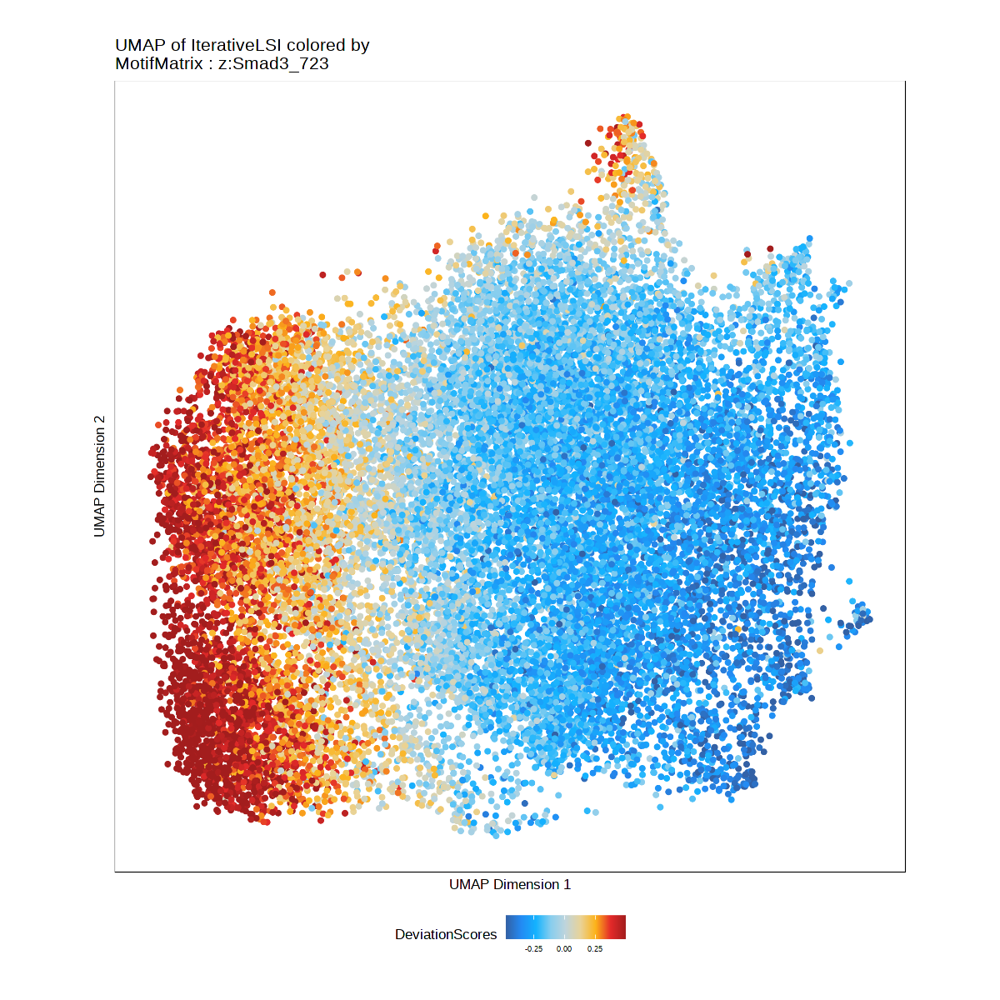

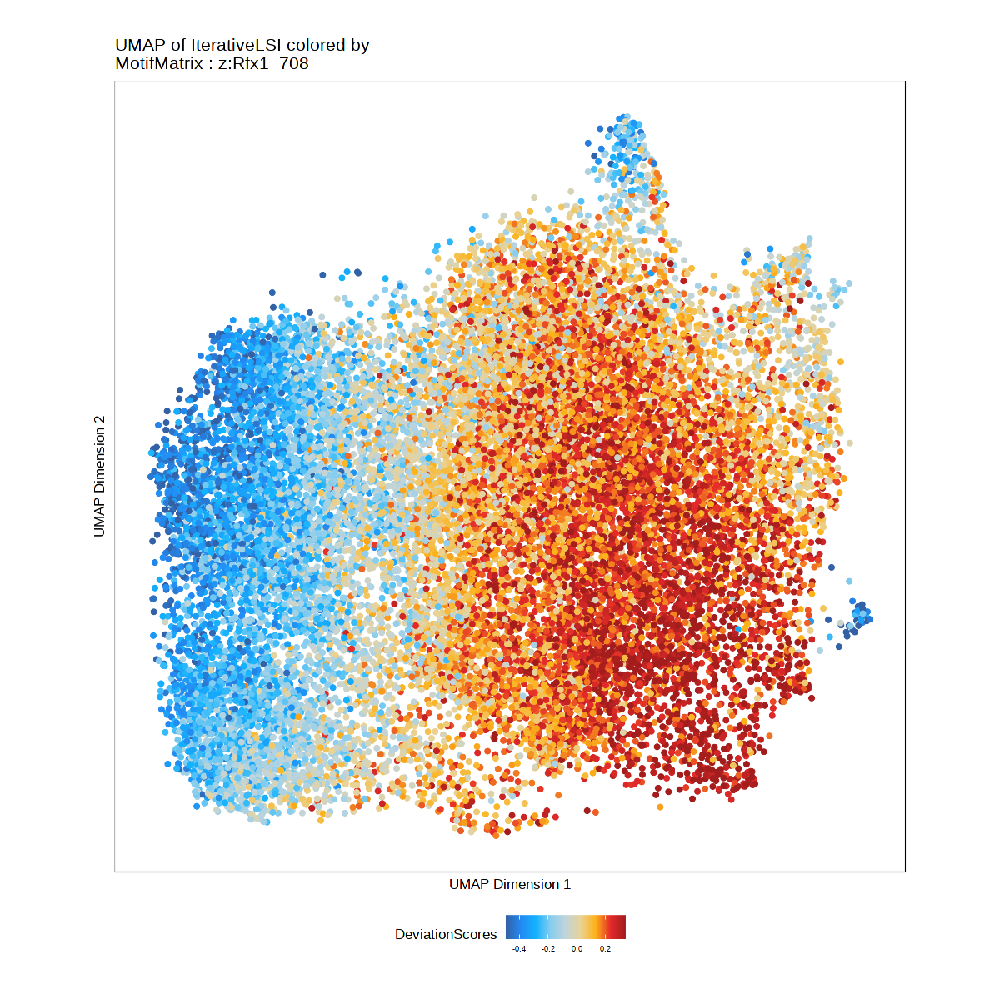

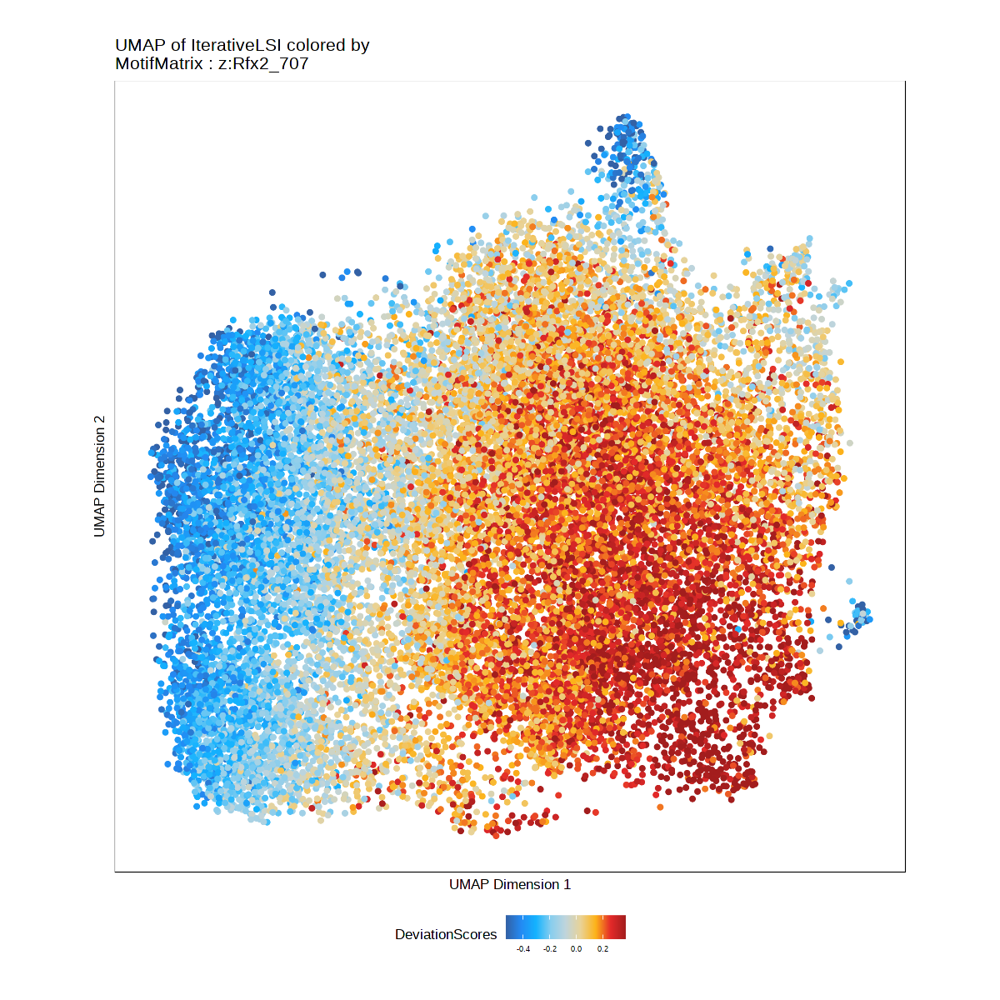

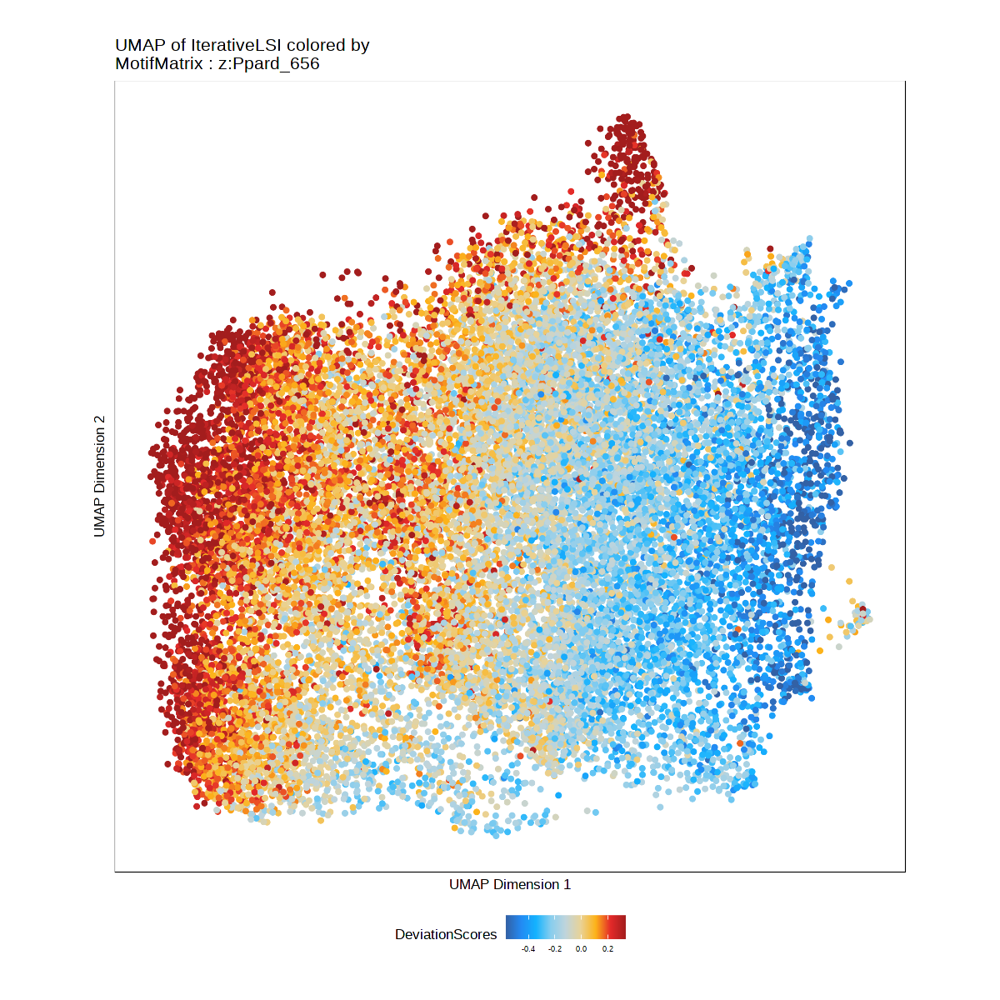

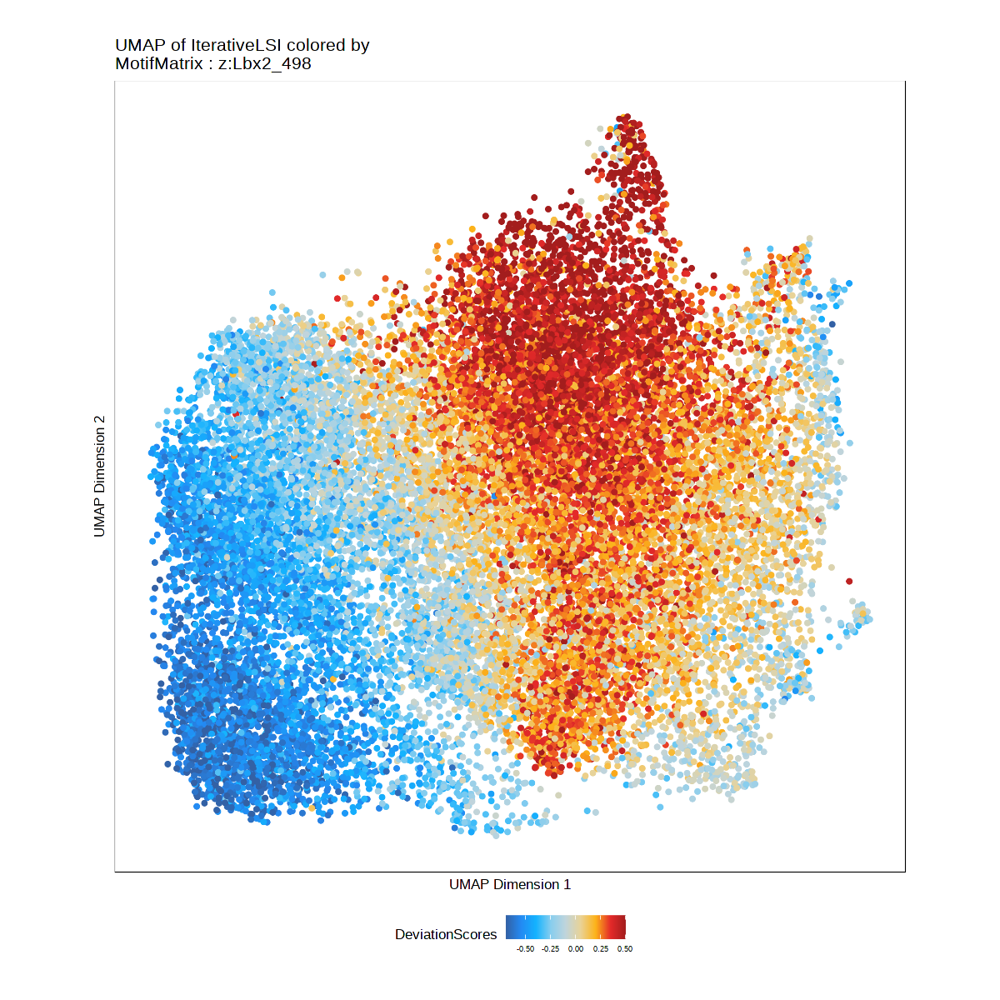

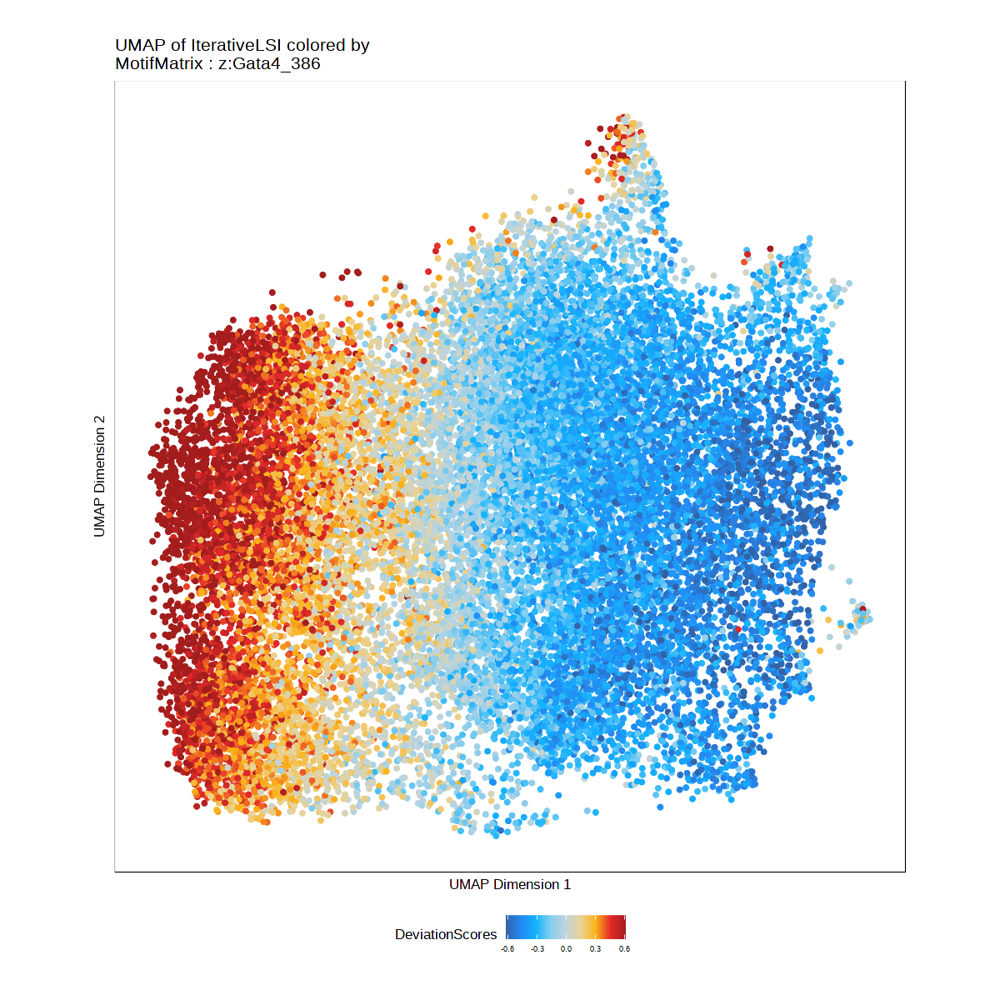

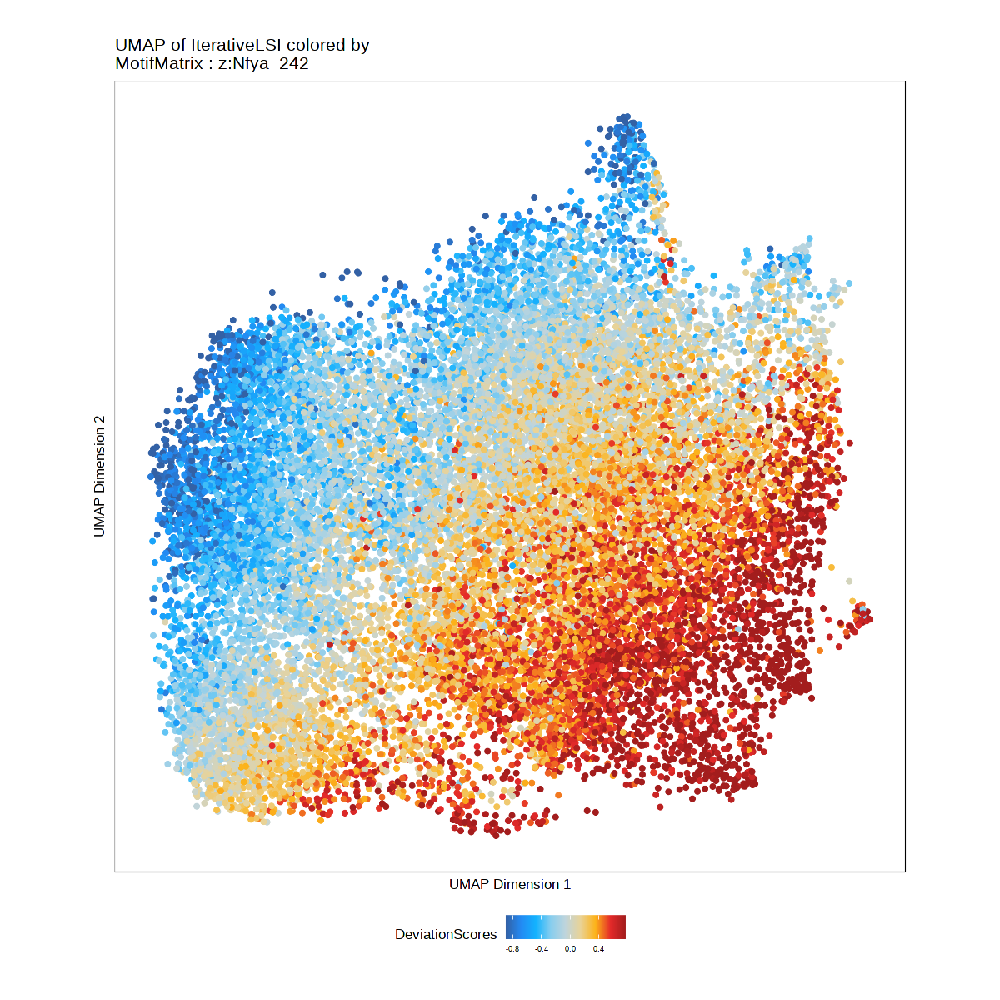

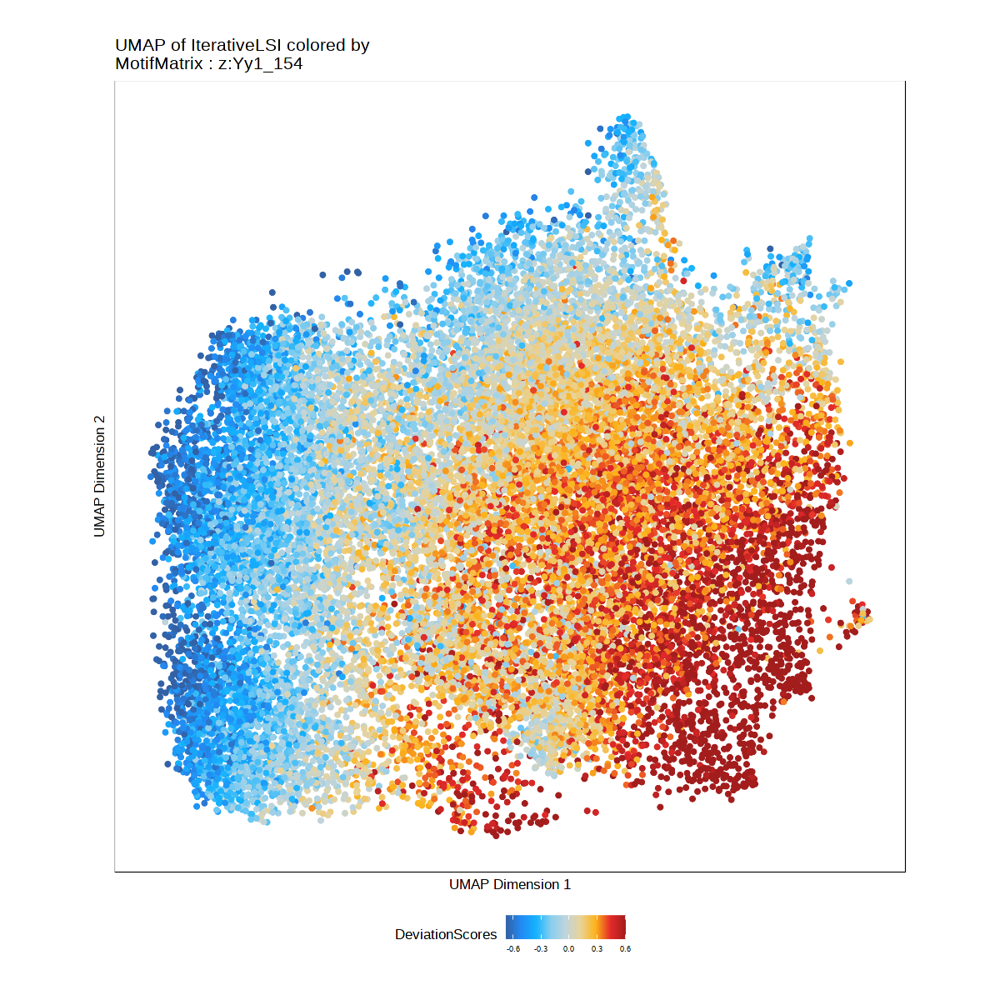

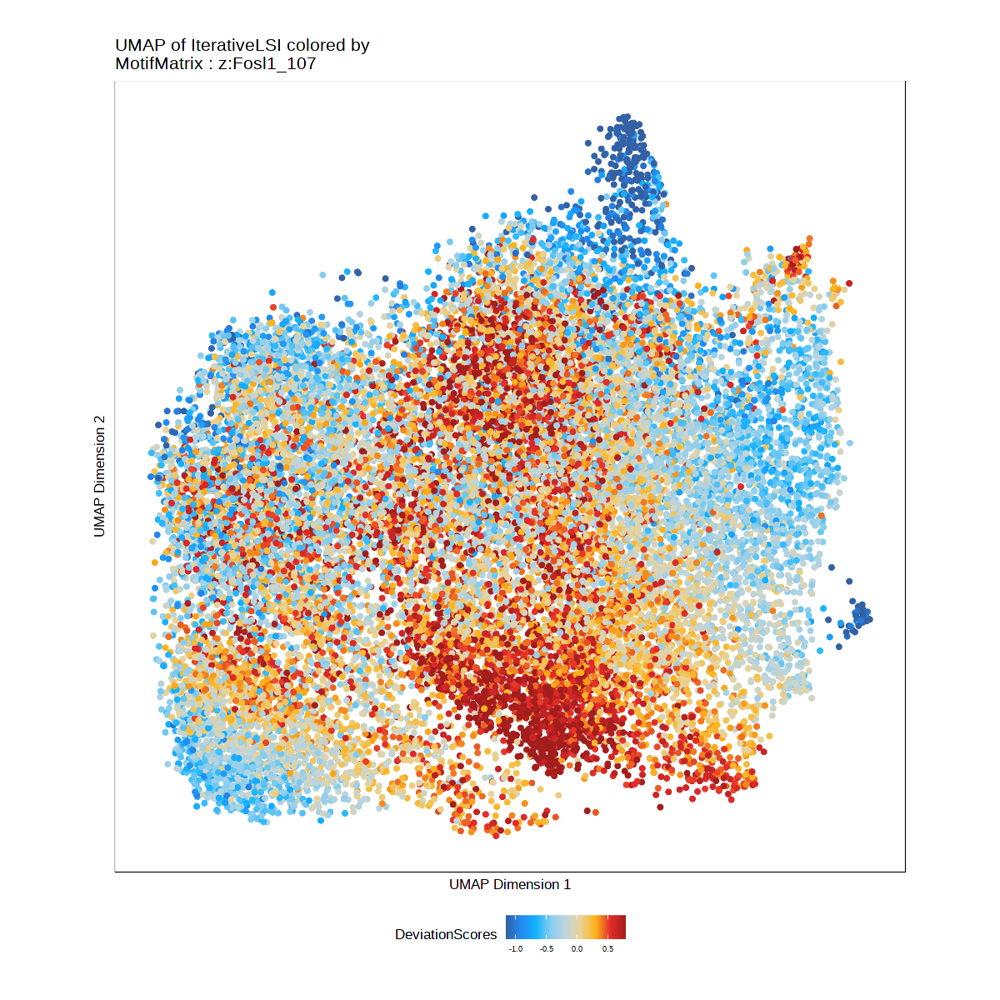

$`z:Smad3_723`

$`z:Rfx1_708`

$`z:Rfx2_707`

$`z:Ppard_656`

$`z:Lbx2_498`

$`z:Gata4_386`

$`z:Nfya_242`

$`z:Yy1_154`

$`z:Fosl1_107`

$`z:Tcf15_93`

$`z:Nhlh2_84`


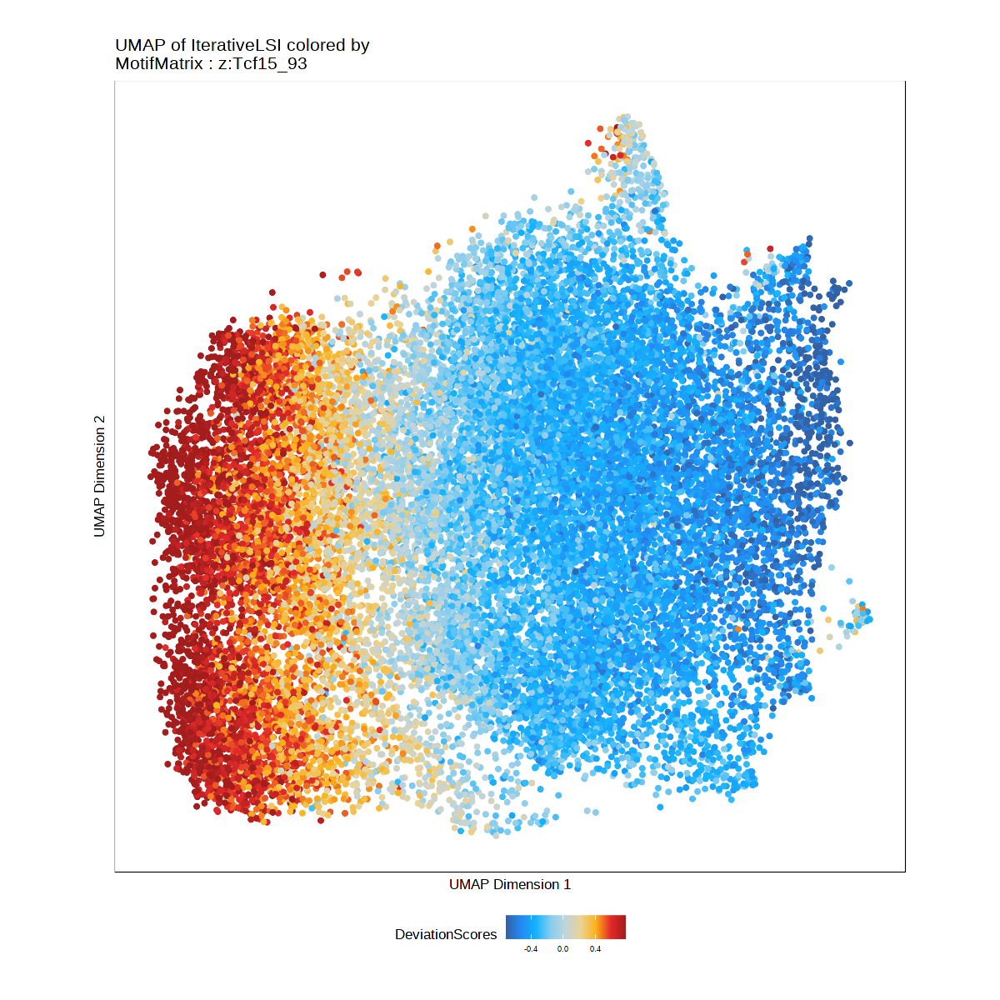

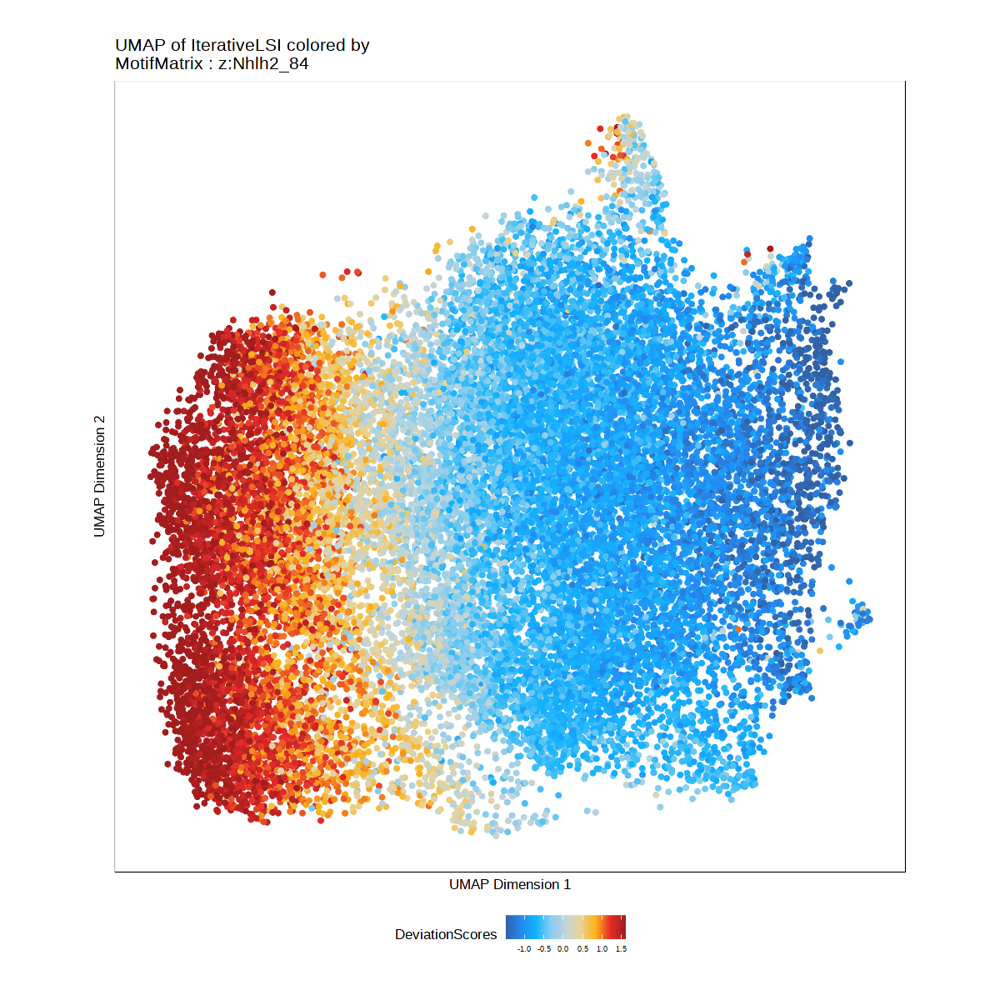

In [78]:
p <- plotEmbedding(
    ArchRProj = Merged.proj.PTM, 
    colorBy = "MotifMatrix",
    name = markerMotifs,
    embedding = "UMAP",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(Merged.proj.PTM),
    plotAs = "point",
    size =1 
)
p


In [10]:
Merged.proj.PTM <- addImputeWeights(Merged.proj.PTM,k=9,ka=3,td=2)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-5c1e3f185791-Date-2020-10-24_Time-23-22-31.log
If there is an issue, please report to github with logFile!

2020-10-24 23:22:31 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [127]:
plotPDF(heatmapEM, name = "PTM.heatmapEM", width = 5, height = 7)

Plotting ComplexHeatmap!



In [44]:
Major.trajectory <- c("C10", "C9", "C8")
Merged.proj.PTM <- addTrajectory(
    ArchRProj = Merged.proj.PTM, 
    name = "Major_trajectory", 
    groupBy = "Seurat.Clusters",
    trajectory = Major.trajectory, 
    embedding = "UMAP", 
    force = TRUE
)


ArchR logging to : ArchRLogs/ArchR-addTrajectory-7f563a2dec98-Date-2020-11-01_Time-13-21-32.log
If there is an issue, please report to github with logFile!

Filtering outliers

Initial Alignment Before Spline Fit

Spline Fit

KNN to Spline

ArchR logging successful to : ArchRLogs/ArchR-addTrajectory-7f563a2dec98-Date-2020-11-01_Time-13-21-32.log



ArchR logging to : ArchRLogs/ArchR-plotTrajectory-7f566eb2474a-Date-2020-11-01_Time-13-21-39.log
If there is an issue, please report to github with logFile!

Plotting

Warning message:
“Removed 14613 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-7f566eb2474a-Date-2020-11-01_Time-13-21-39.log

Warning message:
“Removed 14613 rows containing non-finite values (stat_summary_hex).”


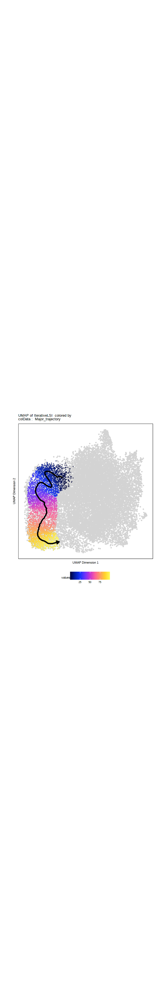

In [45]:
p <- plotTrajectory(Merged.proj.PTM, trajectory = "Major_trajectory", colorBy = "cellColData", name = "Major_trajectory")
p[[1]]


In [47]:
options(repr.plot.height=10,repr.plot.width=8)
trajMM  <- getTrajectory(ArchRProj = Merged.proj.PTM, name = "Major_trajectory", useMatrix = "MotifMatrix", log2Norm = FALSE)
p1 <- plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"),labelTop = 100)
p1

Creating Trajectory Group Matrix..

Some values are below 0, this could be a DeviationsMatrix in which scaleTo should be set = NULL.
Continuing without depth normalization!

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56bbf02e9-Date-2020-11-01_Time-13-25-00.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2020-11-01 13:25:00 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2020-11-01 13:25:00 : 

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56bbf02e9-Date-2020-11-01_Time-13-25-00.log



In [66]:
pdf("PTM.traj.combine2.pdf", width=5, height=6)
#options(repr.plot.height=20,repr.plot.width=8)
ComplexHeatmap::draw(ht1 + ht2, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

In [51]:
trajGSM <- getTrajectory(ArchRProj = Merged.proj.PTM, name = "Major_trajectory", useMatrix = "GeneScoreMatrix", log2Norm = TRUE)
p2 <- trajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"),labelTop = 100)
p2

Creating Trajectory Group Matrix..

Smoothing...

Warning message:
“'trajectoryHeatmap' is deprecated.
Use 'plotTrajectoryHeatmap' instead.
See help("Deprecated")”
ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56aa03277-Date-2020-11-01_Time-13-27-38.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56aa03277-Date-2020-11-01_Time-13-27-38.log



In [65]:
#integration
corGSM_MM <- correlateTrajectories(trajGSM, trajMM,corCutOff = 0.22,varCutOff1=0.5,varCutOff2=0.5)
trajGSM2 <- trajGSM[corGSM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGSM_MM[[1]]$name2, ]

trajCombined <- trajGSM2
assay(trajCombined) <- t(apply(assay(
    trajGSM2), 1, scale)) + t(apply(assay(trajMM2), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)
rowOrder <- match(rownames(combinedMat), rownames(trajGSM2))
ht1 <- plotTrajectoryHeatmap(trajGSM2,  pal = paletteContinuous(set = "horizonExtra"),  varCutOff = 0, rowOrder = rowOrder)
ht2 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder)
ht1 + ht2

ArchR logging to : ArchRLogs/ArchR-correlateTrajectories-7f5612612cec-Date-2020-11-01_Time-13-44-28.log
If there is an issue, please report to github with logFile!

Found 47 Correlated Pairings!

2020-11-01 13:44:41 : 

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f565b0e4116-Date-2020-11-01_Time-13-44-41.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f565b0e4116-Date-2020-11-01_Time-13-44-41.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56647b885b-Date-2020-11-01_Time-13-44-41.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f56647b885b-Date-2020-11-01_Time-13-44-41.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-7f5646bc1448-Date-2020-11-01_Time-13-44-41.log
If there is an issue, please report to github with logFile!

u

ArchR logging to : ArchRLogs/ArchR-correlateTrajectories-f9b4be1bdb2-Date-2020-08-14_Time-16-54-15.log
If there is an issue, please report to github with logFile!

Found 4 Correlated Pairings!

2020-08-14 16:54:26 : 

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9b454ebe0-Date-2020-08-14_Time-16-54-26.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9b454ebe0-Date-2020-08-14_Time-16-54-26.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9b263203-Date-2020-08-14_Time-16-54-26.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9b263203-Date-2020-08-14_Time-16-54-26.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9b514904e0-Date-2020-08-14_Time-16-54-27.log
If there is an issue, please report to github with logFile!

useSeqnames is

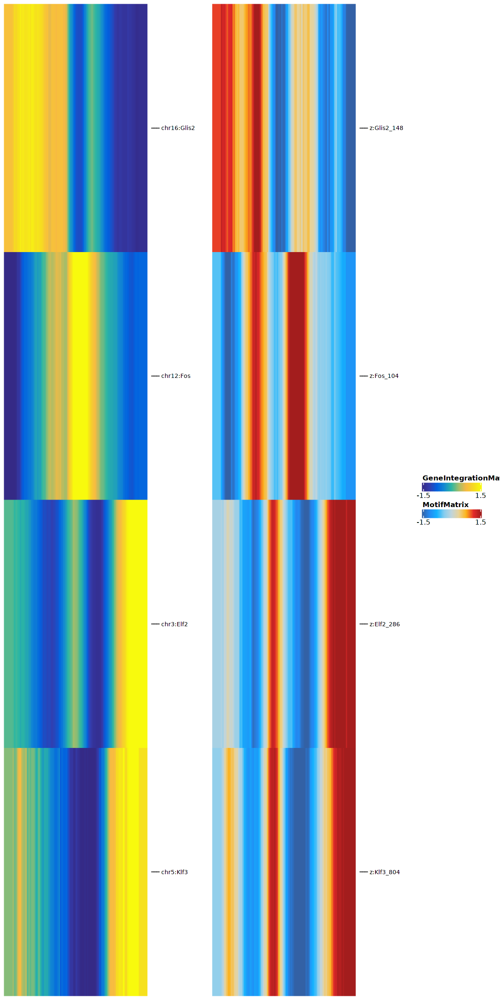

In [32]:
#integration
corGIM_MM <- correlateTrajectories(trajGIM, trajMM,corCutOff = 0.4,varCutOff1=0.5,varCutOff2=0.5)
trajGIM2 <- trajGIM[corGIM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGIM_MM[[1]]$name2, ]

trajCombined <- trajGIM2
assay(trajCombined) <- t(apply(assay(trajGIM2), 1, scale)) + t(apply(assay(trajMM2), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)
rowOrder <- match(rownames(combinedMat), rownames(trajGIM2))
ht3 <- plotTrajectoryHeatmap(trajGIM2,  pal = paletteContinuous(set = "blueYellow"),  varCutOff = 0, rowOrder = rowOrder)
ht4 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder)
ht3 + ht4

### Find positive TF regulators

In [68]:
seGroupMotif <- getGroupSE(ArchRProj = Merged.proj.PTM, useMatrix = "MotifMatrix", groupBy = "Seurat.Clusters")
seGroupMotif

ArchR logging to : ArchRLogs/ArchR-getGroupSE-7f566670fd58-Date-2020-11-01_Time-15-20-10.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2020-11-01 15:20:10 : Constructing Group Matrix 1 of 2, 0.001 mins elapsed.

2020-11-01 15:20:16 : Finished Group Matrix 1 of 2, 0.099 mins elapsed.

2020-11-01 15:20:16 : Constructing Group Matrix 2 of 2, 0.099 mins elapsed.

2020-11-01 15:20:22 : Finished Group Matrix 2 of 2, 0.189 mins elapsed.

2020-11-01 15:20:22 : Successfully Created Group Matrix, 0.189 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-7f566670fd58-Date-2020-11-01_Time-15-20-10.log



class: SummarizedExperiment 
dim: 1768 10 
metadata(0):
assays(1): MotifMatrix
rownames(1768): f1 f2 ... f1767 f1768
rowData names(3): seqnames idx name
colnames(10): C1 C10 ... C8 C9
colData names(21): TSSEnrichment ReadsInTSS ... Major_trajectory nCells

In [69]:
seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]
rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

In [70]:
corGSM_MM <- correlateMatrices(
    ArchRProj = Merged.proj.PTM,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "IterativeLSI"
)
corGSM_MM

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-7f563a3692a-Date-2020-11-01_Time-15-20-48.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2020-11-01 15:20:49 : Testing 793 Mappings!, 0.016 mins elapsed.

2020-11-01 15:20:49 : Computing KNN, 0.016 mins elapsed.

2020-11-01 15:20:49 : Identifying Non-Overlapping KNN pairs, 0.023 mins elapsed.

2020-11-01 15:20:51 : Identified 500 Groupings!, 0.054 mins elapsed.

2020-11-01 15:20:52 : Getting Group Matrix 1, 0.062 mins elapsed.

2020-11-01 15:21:28 : Getting Group Matrix 2, 0.671 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlations...

2020-11-01 15:21:37 : 

Computing Correlation (250 

DataFrame with 793 rows and 14 columns
    GeneScoreMatrix_name MotifMatrix_name                 cor
                 <array>          <array>           <numeric>
1                  Sox17        Sox17_733    0.20336201444336
2                  Mybl1        Mybl1_647   0.313715667253744
3                    Msc           Msc_43  -0.350682091285559
4                 Arid5a         Arid5a_9 -0.0958360645170055
5                  Npas2         Npas2_44   0.263255965625544
...                  ...              ...                 ...
789                 Esx1         Esx1_444   0.169303062084673
790                 Klf8         Klf8_194 -0.0395131174728289
791               Mbtps2       Mbtps2_813   0.143056881762222
792                 Zfy1         Zfy1_213  0.0394400014011117
793                  Sry          Sry_748                  NA
                    padj                 pval GeneScoreMatrix_seqnames
               <numeric>            <numeric>                    <Rle>
1     0.00358

[1] "Fosl1" "Gata4" "Lbx2"  "Nfya"  "Nhlh2" "Ppard" "Rfx1"  "Rfx2"  "Smad3"
[10] "Tcf15" "Yy1"

Warning message:
“Removed 7 rows containing missing values (geom_point).”


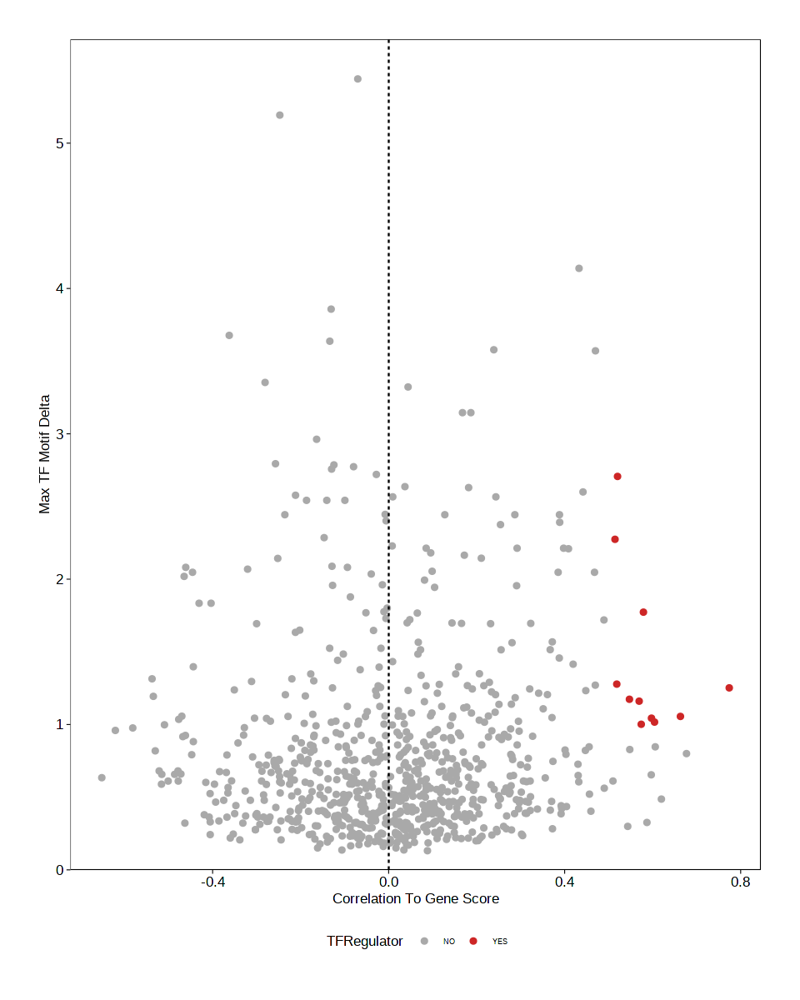

In [71]:
corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.01 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.75))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

p <- ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Score") +
  ylab("Max TF Motif Delta") +
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGSM_MM$maxDelta)*1.05)
  )

p

In [131]:
library(ggplot2)
library(gghighlight)
library(ggrepel)
## scatter plot
pdf(file="PTM.positiveTF.pdf",width=5,height=5)
ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, lable = GeneScoreMatrix_name))+ 
geom_point(colour="darkred",size=2) +
theme_ArchR()+
gghighlight(cor > 0.5 & padj < 0.01 & maxDelta > quantile(corGSM_MM$maxDelta, 0.75)) +
geom_label_repel(aes(label = GeneScoreMatrix_name),
                  box.padding   = 0.5, 
                 label.size = 0.1,
                  point.padding = 0.5,
                  segment.size = 0.5,
                  segment.color = 'grey50')
 dev.off()

Warning message:
“Removed 7 rows containing missing values (geom_point).”


png 
  2

In [129]:
positive.TF <- sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])
positive.TF

[1] "Fosl1" "Gata4" "Lbx2"  "Nfya"  "Nhlh2" "Ppard" "Rfx1"  "Rfx2"  "Smad3"
[10] "Tcf15" "Yy1"

In [254]:
rownames(markersGS) <- rowData(markersGS)$name
colData(markersGS)$celltype <- colnames(markersGS)

In [255]:
rownames(seZ) <- gsub("_.*","",rowData(seZ)$name)
colData(seZ)$celltype <- colData(seZ)$Seurat.Clusters
seZ

class: SummarizedExperiment 
dim: 884 3 
metadata(0):
assays(1): MotifMatrix
rownames(884): Tcfap2a Tcfap2b ... Smad5 Smad9
rowData names(4): seqnames idx name maxDelta
colnames(3): C1 C2 C3
colData names(20): TSSEnrichment ReadsInTSS ...
  predictedScore_Un_woharmony nCells

In [256]:
saveRDS(markersGS,file="LC.markersGIM.rds")
saveRDS(seZ,file="LC.seZ.rds")
saveRDS(positive.TF,file="LC.postiveTF.rds")

In [104]:
saveArchRProject(ArchRProj = Merged.proj.SC,load = TRUE)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /home/leetl/Gonocyte/Raw_data/Germcell.subset.newversion 
samples(4): P3 E18 P6 P0
sampleColData names(1): ArrowFiles
cellColData names(24): Sample TSSEnrichment ... Major_trajectory
  Minor_trajectory
numberOfCells(1): 710
medianTSS(1): 15.571
medianFrags(1): 11304.5